In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from pathlib import Path

import re
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
RANDOM_STATE = 42
df = pd.read_parquet("year_MNSENA_results_cut/qtransform_features.parquet")

feature_columns = [col for col in df.columns if col.startswith("feature_")]
if len(feature_columns) == 0:
    raise ValueError("No feature_* columns found.")

print(f"Number of features: {len(feature_columns)}")

X = df[feature_columns].to_numpy(dtype="float64")
print(f"X.shape = {X.shape}")

X_max = X.max(axis=1, keepdims=True)
#X_max = X_max.T
#print(X_max[0])

Number of features: 1230
X.shape = (161837, 1230)


In [ ]:
#print(df.head(0))
#print(df.head(2))

   year station channel                       file        date month_year  \
0  2022    SENA     HHZ  SENA_HHZ_2022-01-04.mseed  2022-01-04   jan_2022   
1  2022    SENA     HHZ  SENA_HHZ_2022-01-04.mseed  2022-01-04   jan_2022   

                  trigger_time  feature_0000  feature_0001  feature_0002  ...  \
0  2022-01-04T07:58:09.470000Z      0.184105       1.77506      2.757165  ...   
1  2022-01-04T08:15:47.620000Z      1.013360       0.28507      3.198920  ...   

   feature_1225  feature_1226  feature_1227  feature_1228  feature_1229  \
0      2.665701     15.319556     21.230066     27.538059      1.949612   
1      0.640440      1.191368      1.324022      0.136881      0.082166   

       label        run  _file_date  _day_str  _qtransform_index  
0  Unlabeled  Unlabeled  2022-01-04  20220104                  0  
1  Unlabeled  Unlabeled  2022-01-04  20220104                  1  

[2 rows x 1242 columns]


In [5]:
X_norm = X / X_max

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_norm)
print(f"Scaled matrix: {X_scaled.shape}") 

Scaled matrix: (161837, 1230)


In [6]:
PCA_COMPONENTS = 40

n_components = min(PCA_COMPONENTS,X_scaled.shape[0] - 1,X_scaled.shape[1])
pca = PCA(n_components=n_components,random_state=RANDOM_STATE)

X_pca = pca.fit_transform(X_scaled)
explained_variance = np.sum(pca.explained_variance_ratio_)

print(f"PCA components: {n_components}")
print(f"Explained variance: {explained_variance:.4f}")

tsne = TSNE(n_components=2,perplexity=90,early_exaggeration=14,init="pca",learning_rate="auto",random_state=RANDOM_STATE, metric='cosine')
X_tsne = tsne.fit_transform(X_pca)

PCA components: 40
Explained variance: 0.5915


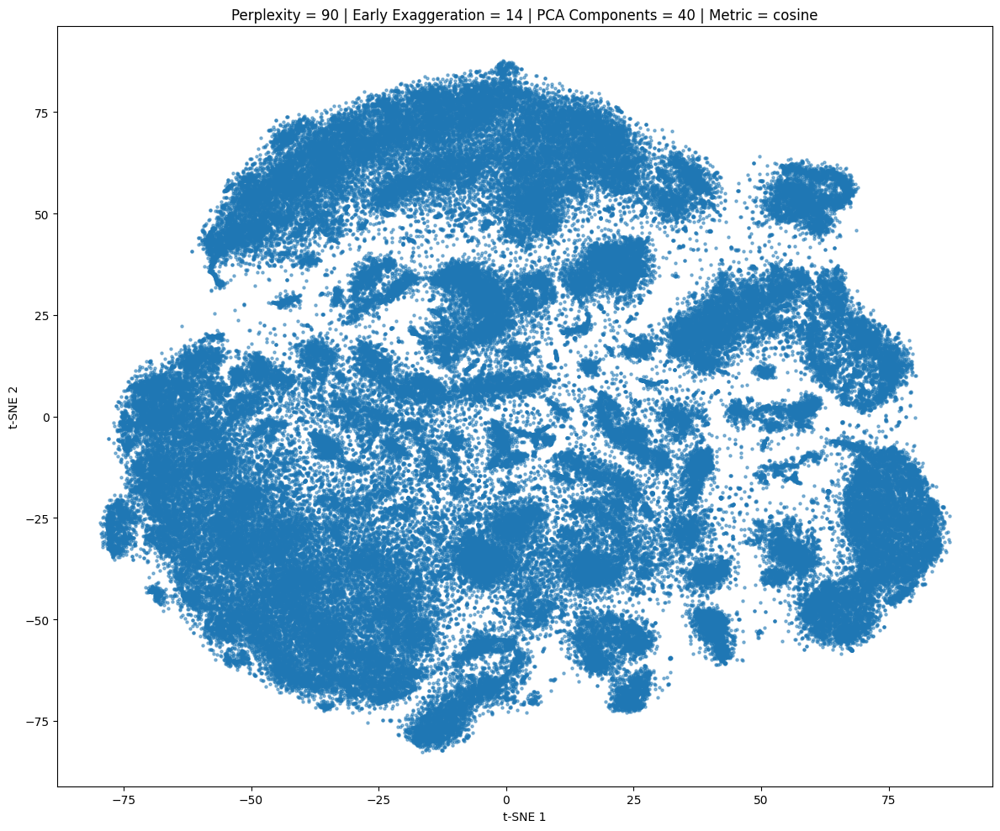

In [7]:
fig, ax = plt.subplots(figsize=(12, 10))
scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1],s=5,alpha=0.5)
ax.set_title(f"Perplexity = 90 | Early Exaggeration = 14 | PCA Components = {PCA_COMPONENTS} | Metric = cosine")
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")

plt.tight_layout()
plt.show()

Masks by year and by month

2022: 57512 points


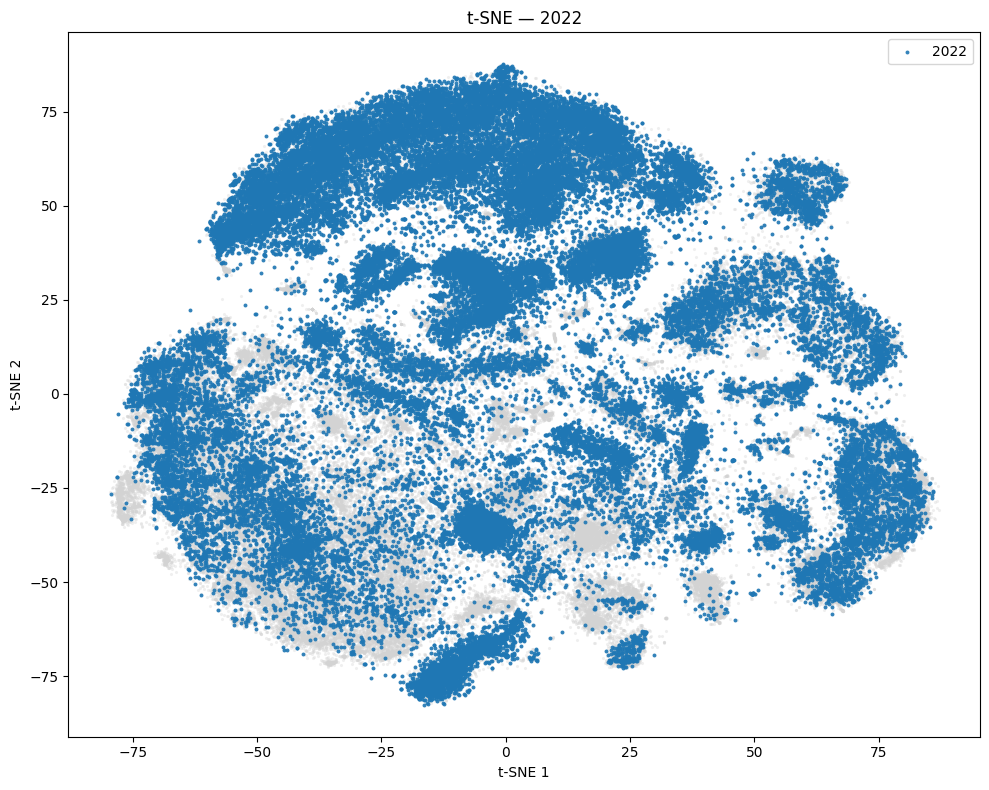

2023: 42302 points


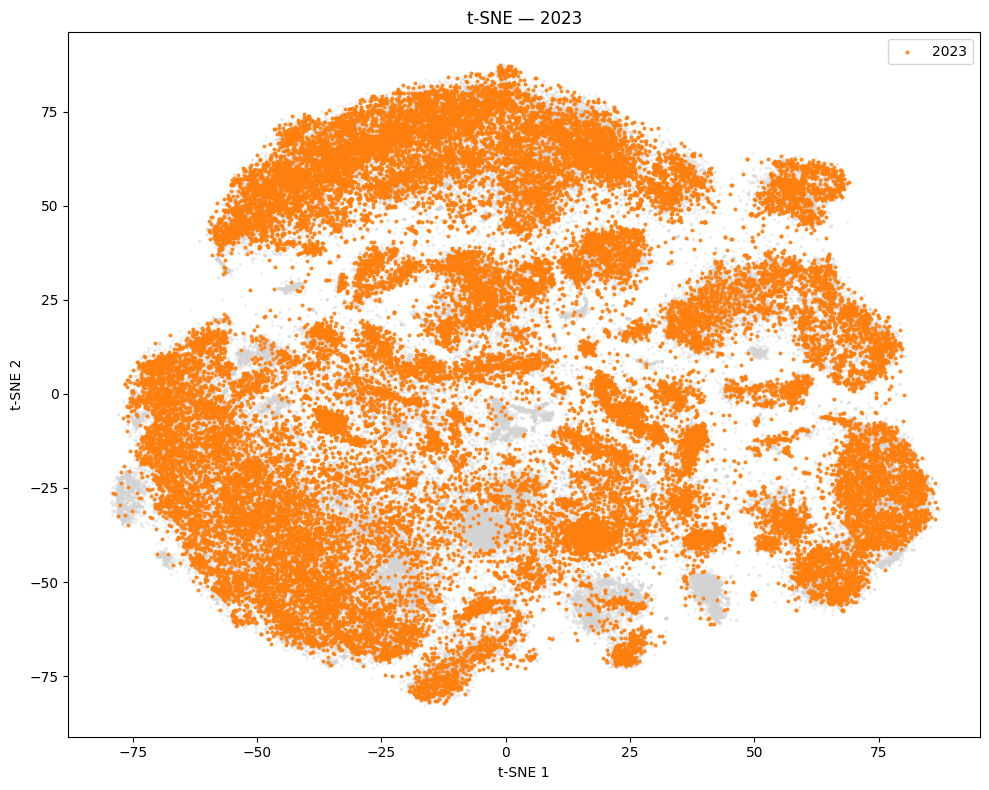

2024: 34174 points


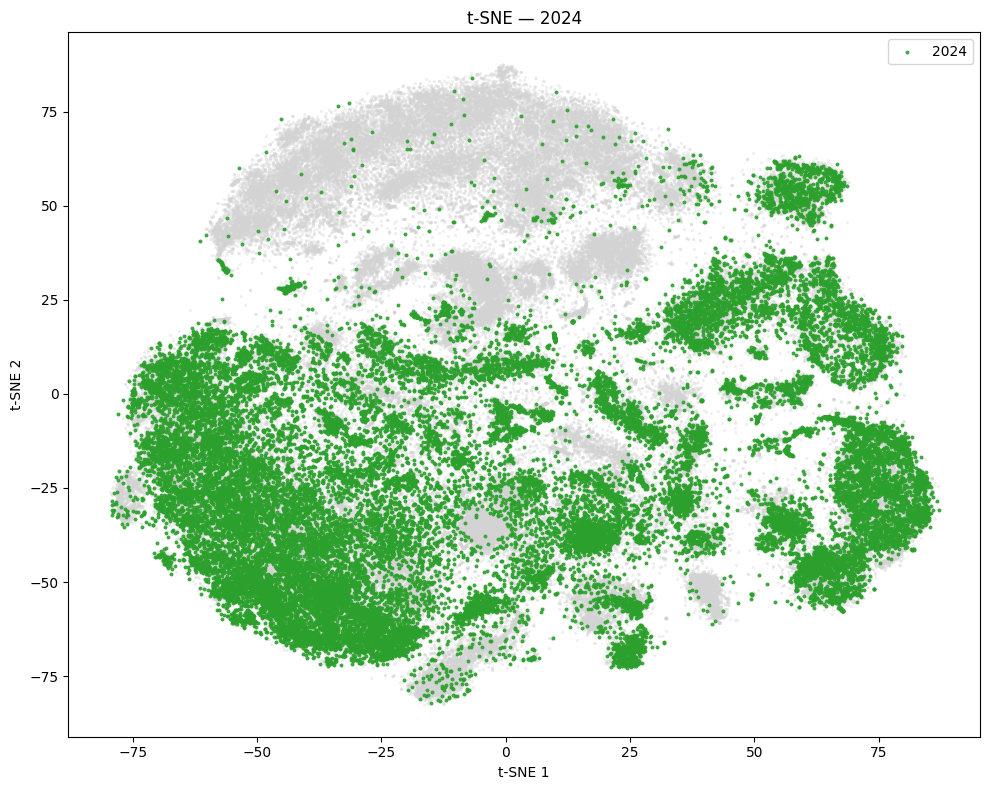

2025: 27849 points


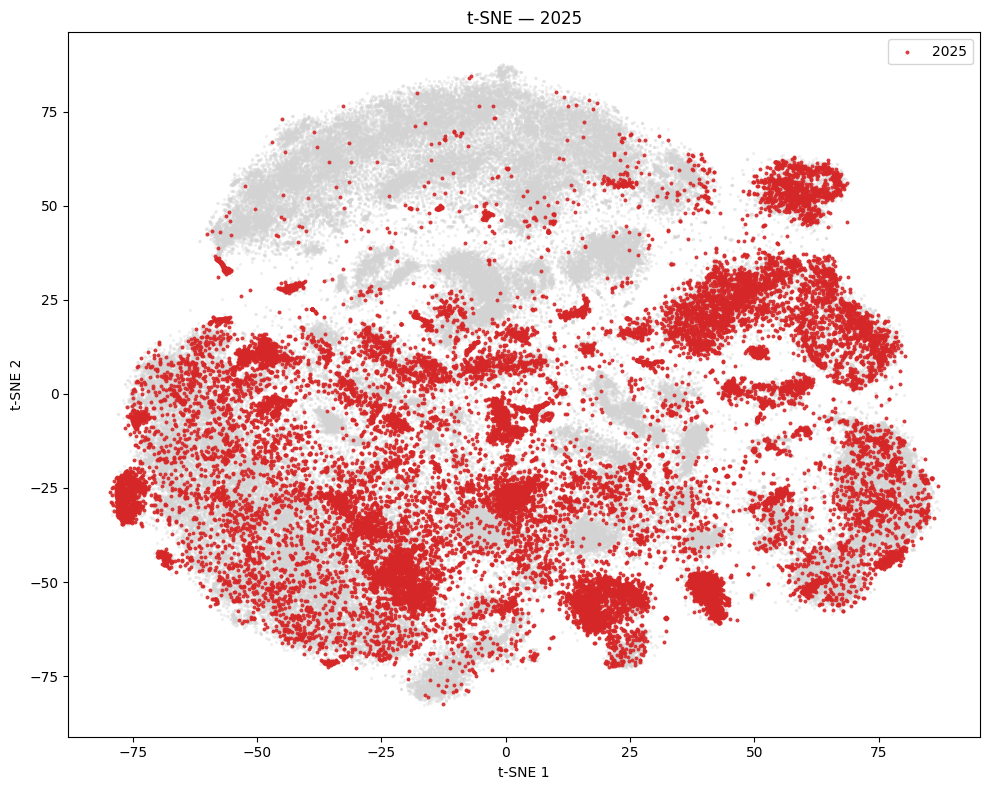

In [22]:
YEARS = [2022, 2023, 2024, 2025]
YEAR_COLORS = {2022: "tab:blue",2023: "tab:orange",2024: "tab:green", 2025: "tab:red"}

#print(df["year"].unique())
#print(df["year"].value_counts().sort_index())

df["year"] = pd.to_numeric(df["year"], errors="coerce")

for year in YEARS:
    mask = df["year"].eq(year).to_numpy()
    print(f"{year}: {mask.sum()} points")
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.scatter(X_tsne[:, 0],X_tsne[:, 1],s=5,c="lightgray",alpha=0.35,linewidths=0,zorder=1)
    ax.scatter(X_tsne[mask, 0],X_tsne[mask, 1],s=8,c=YEAR_COLORS[year],alpha=0.9,linewidths=0,label=str(year),zorder=2)
    ax.set_title(f"t-SNE — {year}")
    ax.set_xlabel("t-SNE 1")
    ax.set_ylabel("t-SNE 2")
    ax.legend()
    plt.tight_layout()
    plt.show()

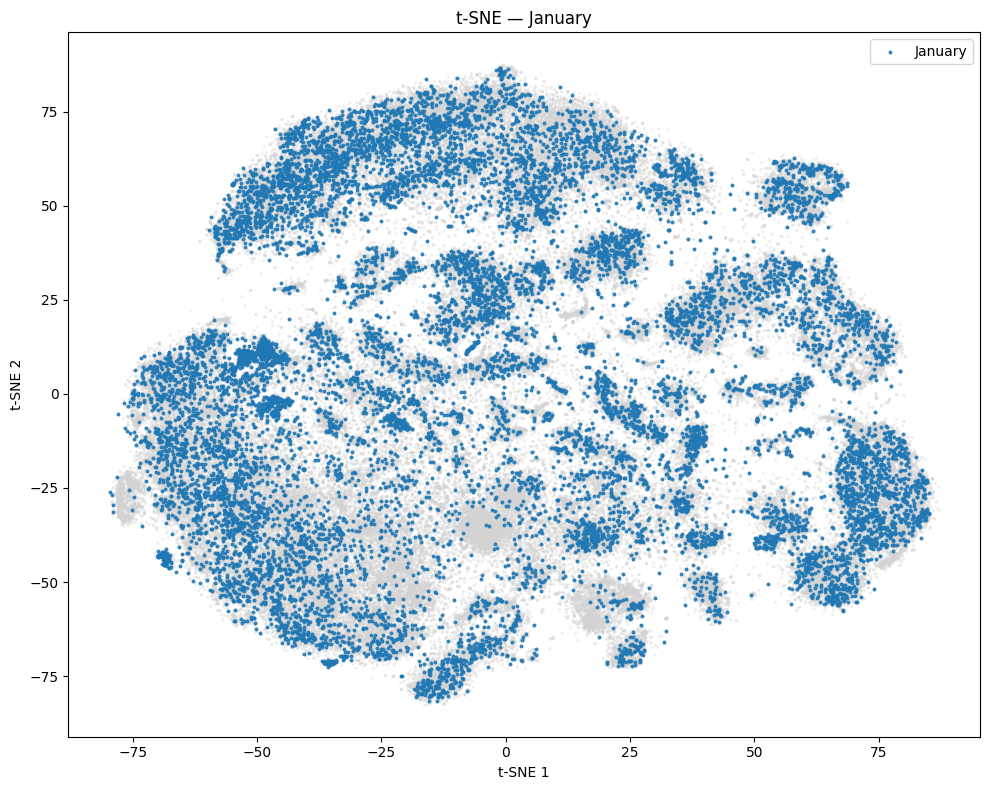

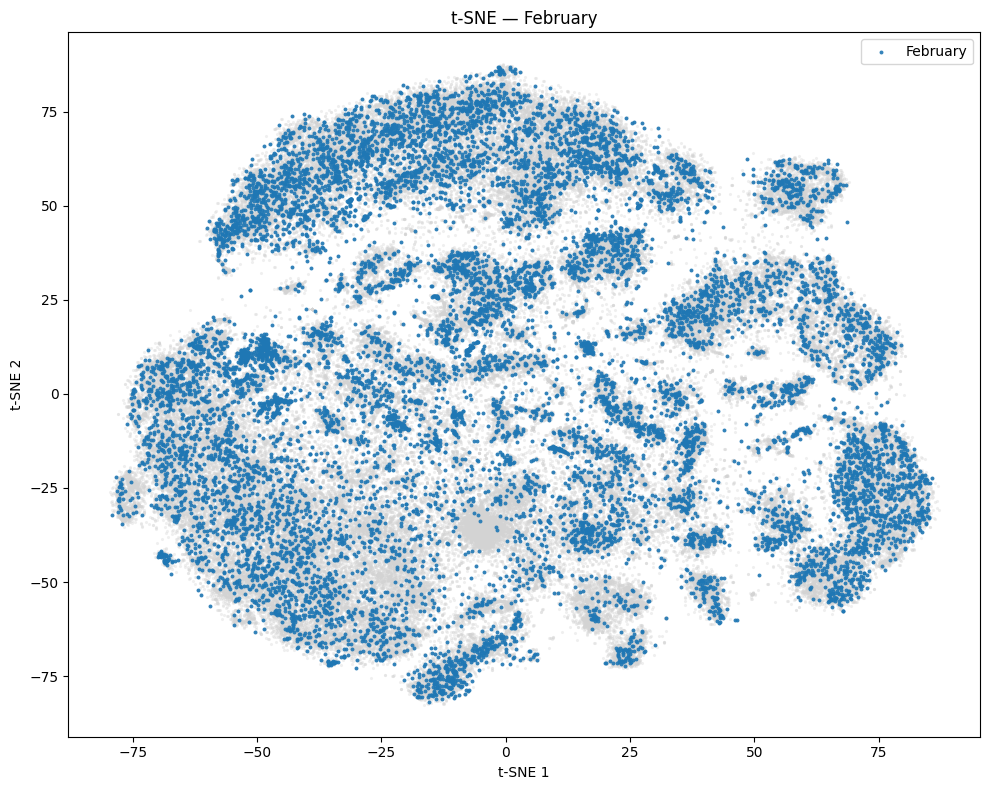

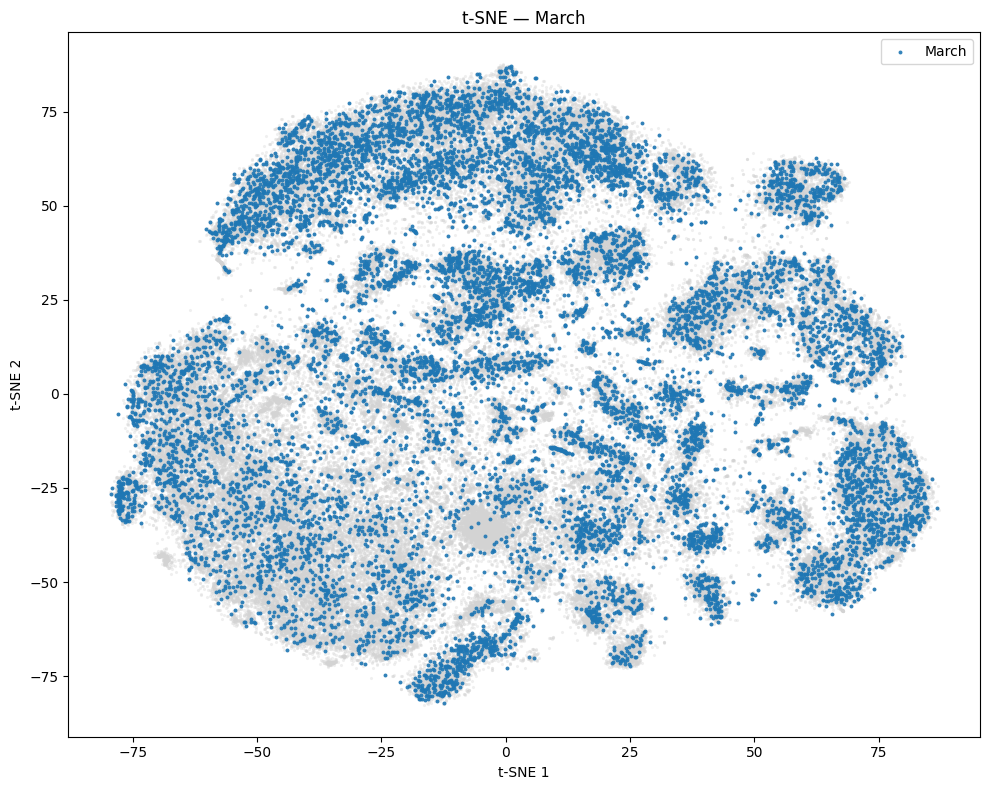

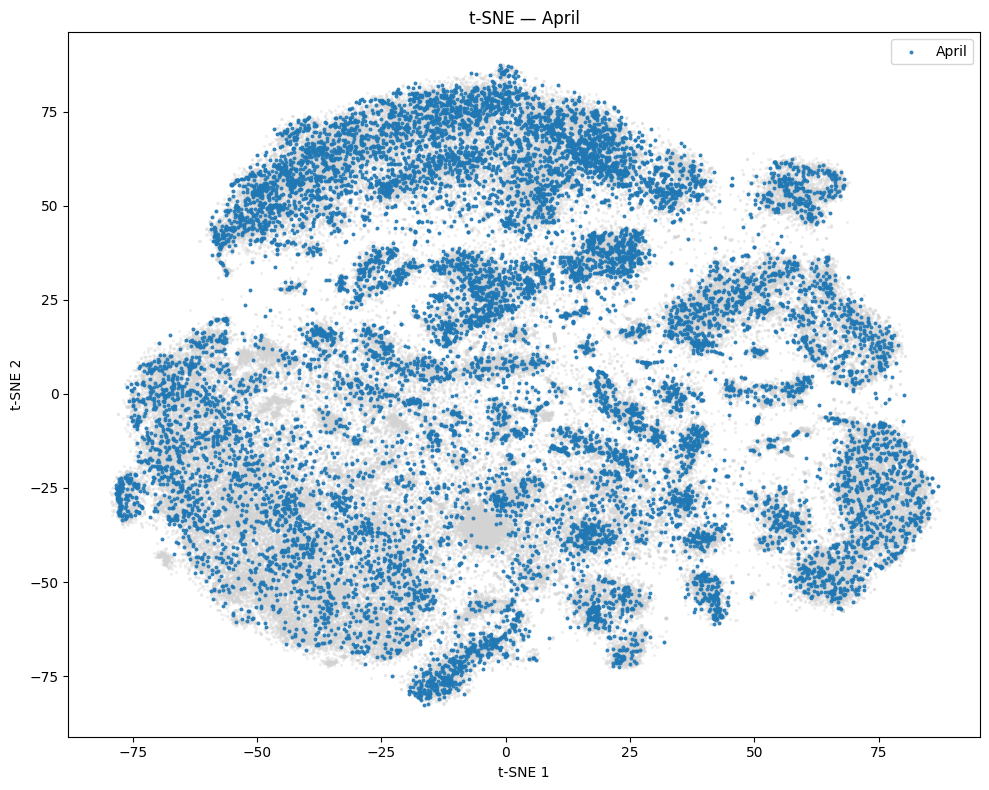

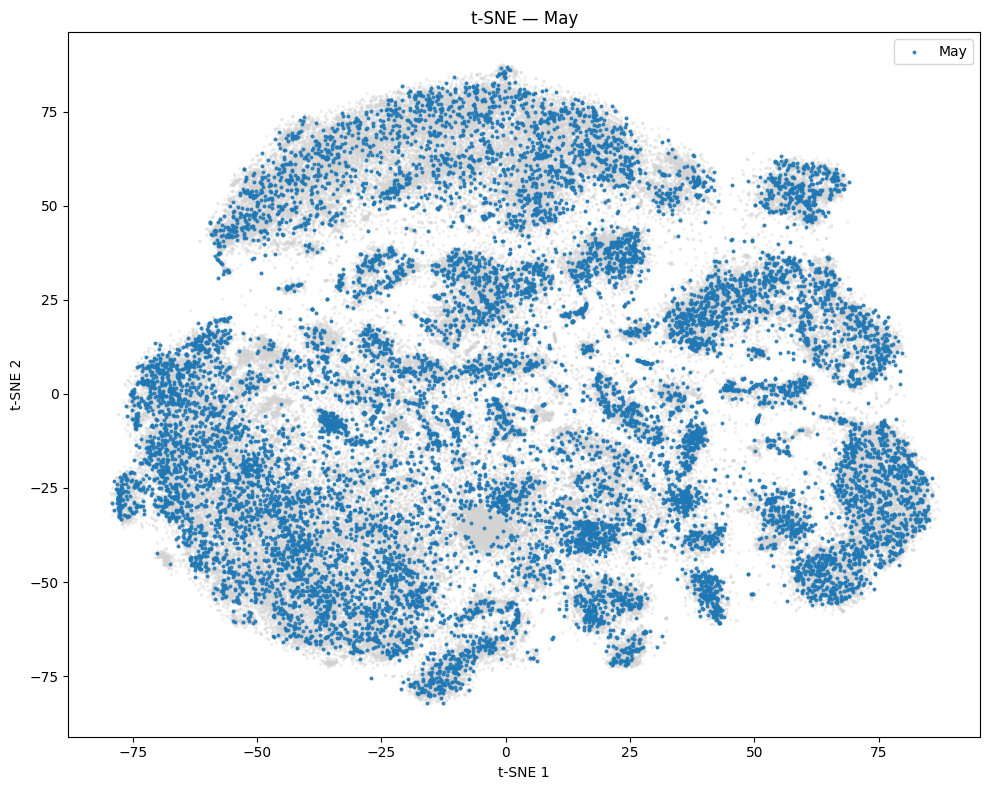

...

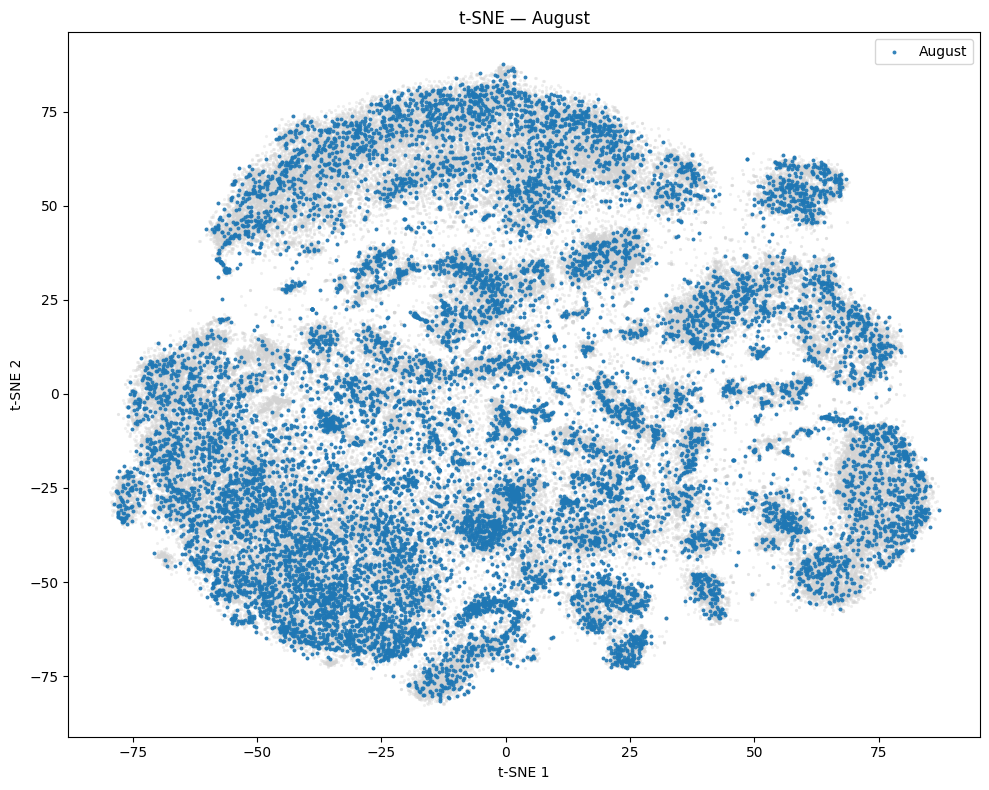

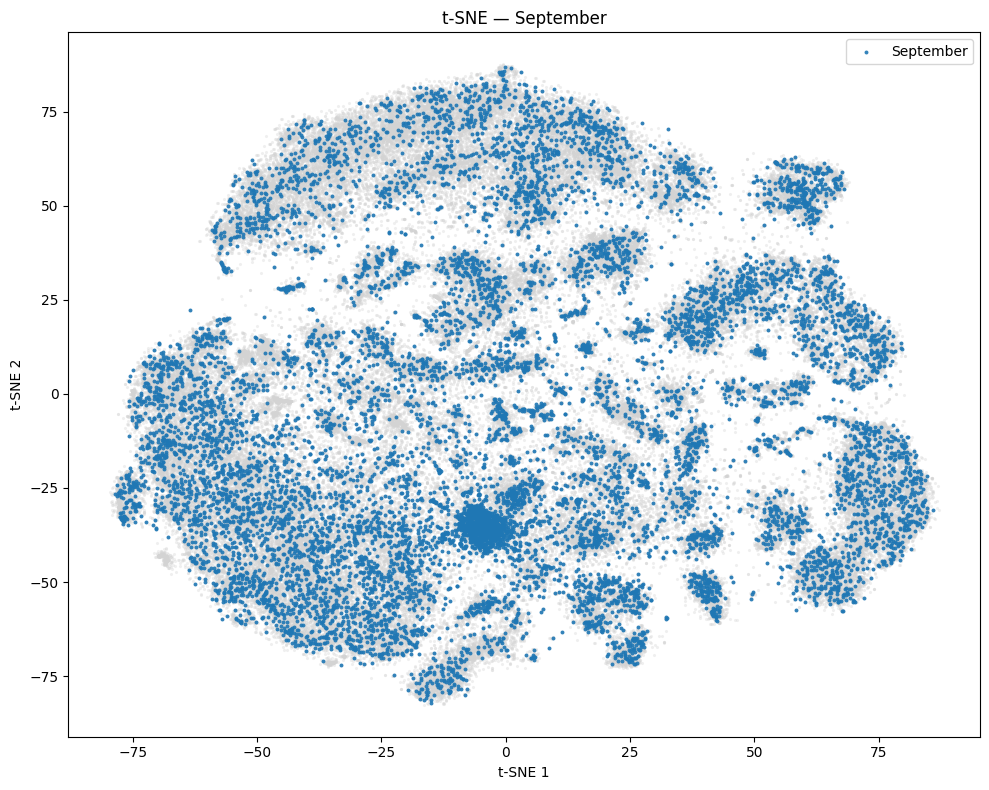

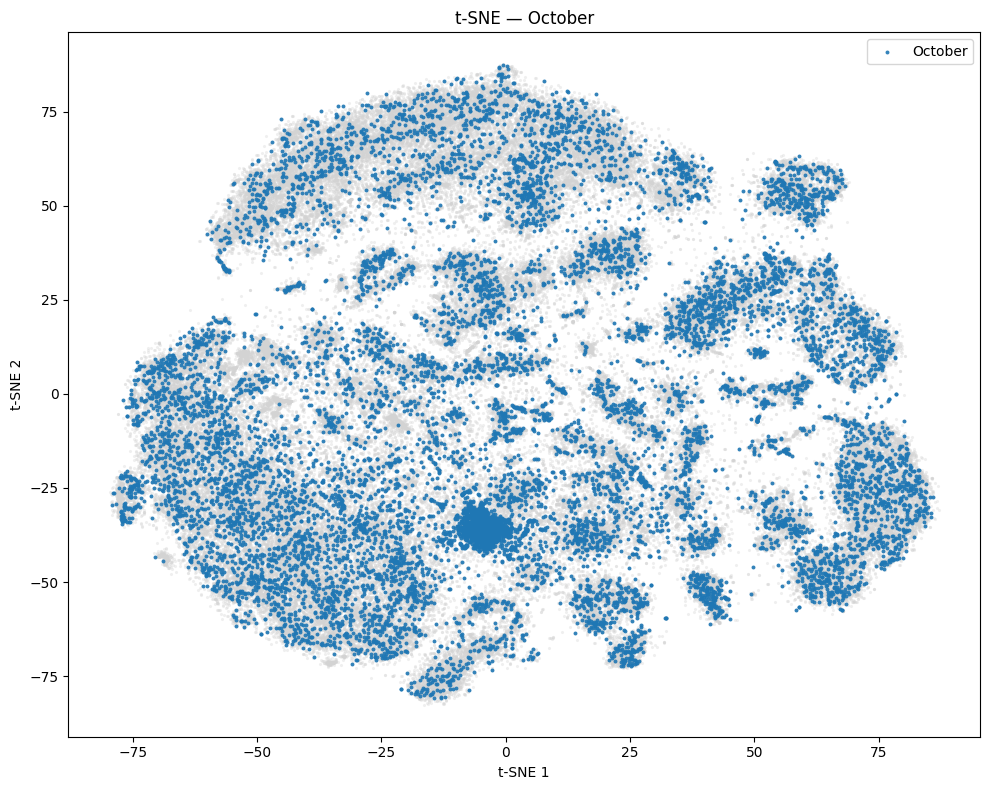

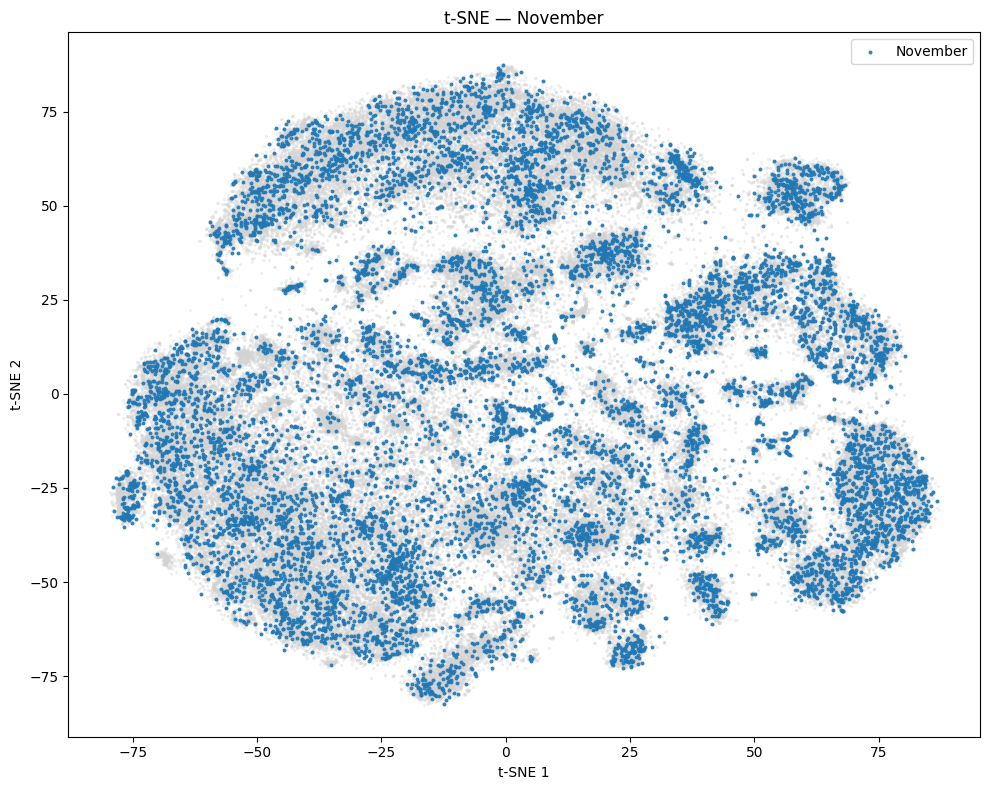

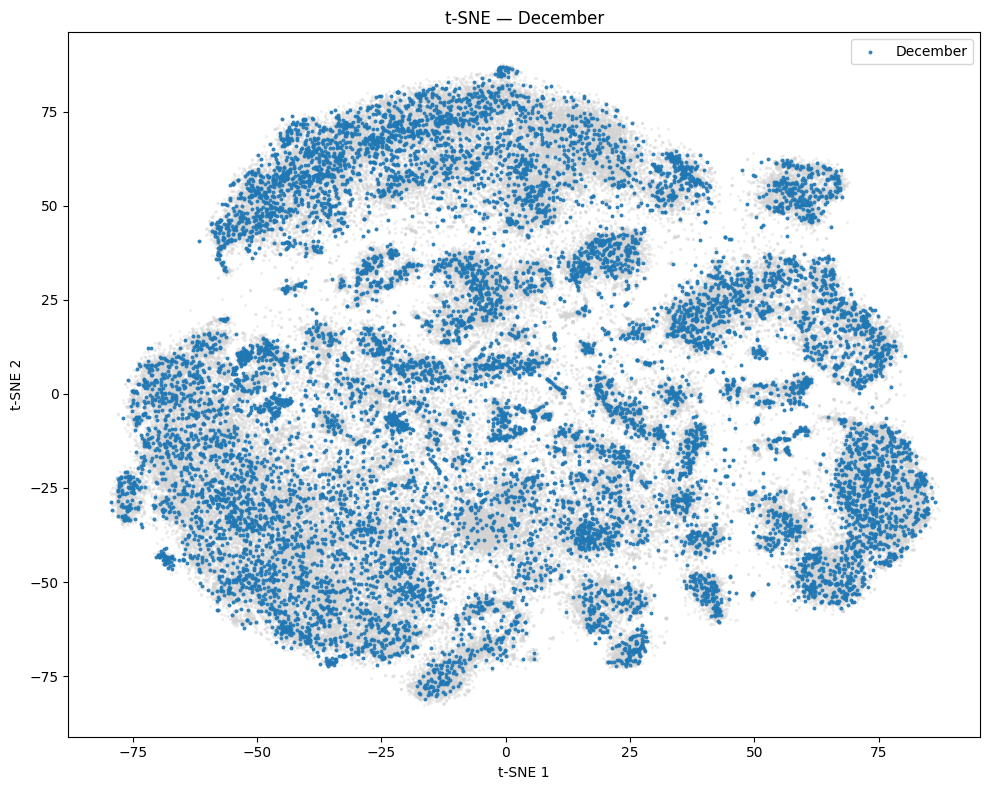

In [25]:
MONTHS = sorted(df["month_year"].dropna().unique())
MONTH_COLOR = "tab:blue"

df["month"] = pd.to_datetime(df["month_year"], format="%b_%Y").dt.month
MONTHS = range(1, 13)

for month in MONTHS:
    mask = df["month"].eq(month).to_numpy()
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.scatter(X_tsne[:, 0],X_tsne[:, 1],s=5,c="lightgray",alpha=0.35,linewidths=0,zorder=1)
    ax.scatter(X_tsne[mask, 0],X_tsne[mask, 1],s=8,c="tab:blue",alpha=0.9,linewidths=0,label=pd.Timestamp(2000, month, 1).strftime("%B"),zorder=2)
    ax.set_title(f"t-SNE — {pd.Timestamp(2000, month, 1).strftime('%B')}")
    ax.set_xlabel("t-SNE 1")
    ax.set_ylabel("t-SNE 2")
    ax.legend()
    plt.tight_layout()
    plt.show()

Interactive Graph

In [ ]:
import os
from pathlib import Path

import numpy as np
import pymupdf
import plotly.graph_objects as go
import ipywidgets as widgets

from IPython.display import display, Image, clear_output

PATH = Path("year_MNSENA_results_cut")
PDF_DPI = 150
IMAGE_WIDTH = 900

# I don't know why it works this way, but it only works this way so please don't remove these four following lines

if "label" not in df.columns:
    df["label"] = "Unlabeled"

label_map = df.drop_duplicates("file").set_index("file")["label"]
df["label"] = df["file"].map(label_map).fillna("Unlabeled")
df["run"] = df["file"].map(label_map).fillna("Unlabeled")


def parse_date_from_filename(filename):
    filename = str(filename)
    match = re.search(r"(20\d{2})-(\d{2})-(\d{2})", filename)
    if match is None:
        raise ValueError(
            f"Could not extract date from filename: {filename}")

    year, month, day = match.groups()

    return pd.Timestamp(year=int(year),month=int(month),day=int(day))


df["_file_date"] = df["file"].apply(parse_date_from_filename)
df["_day_str"] = df["_file_date"].dt.strftime("%Y%m%d")
df["_qtransform_index"] = (df.groupby(["run","station","channel","month_year","_day_str"],sort=False).cumcount())


# ---------------------------------------------------------
# Build PDF path
# ---------------------------------------------------------

def get_qtransform_path(df_index):
    row = df.iloc[df_index]

    run = Path(str(row["year"]))
    station = str(row["station"])
    channel = str(row["channel"])
    month_year = str(row["month_year"])

    day_str = str(row["_day_str"])
    i = int(row["_qtransform_index"])
    file = f"qtransform_{day_str}_{i:06d}.pdf"
    pdf_path = (PATH/run/station/channel/month_year/file)

    return pdf_path

customdata = np.column_stack([np.arange(len(df)),df["file"].astype(str).values,df["label"].astype(str).values])

fig = go.FigureWidget(
    data=[go.Scatter(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        mode="markers",
        marker=dict(size=5, opacity=0.5),
        customdata=customdata,
        hovertemplate=(
            "<b>DataFrame index:</b> %{customdata[0]}<br>"
            "<b>File:</b> %{customdata[1]}<br>"
            "<b>Label:</b> %{customdata[2]}<br>"
            "<b>t-SNE 1:</b> %{x:.3f}<br>"
            "<b>t-SNE 2:</b> %{y:.3f}"
            "<extra></extra>"
        ),
    )]
)

fig.update_layout(
    title=(f"Perplexity = 90 | Early Exaggeration = 14 | PCA Components = {PCA_COMPONENTS} | Metric = cosine"),
    xaxis_title="t-SNE 1", yaxis_title="t-SNE 2", width=1000, height=800, hovermode="closest")

image_output = widgets.Output(layout=widgets.Layout(width="1000px"))

pdf_cache = {}

def render_pdf(pdf_path, dpi=PDF_DPI):
    if not os.path.exists(pdf_path):
        raise FileNotFoundError(f"PDF not found:\n{pdf_path}")

    if pdf_path in pdf_cache:
        return pdf_cache[pdf_path]

    pdf = pymupdf.open(pdf_path)

    try:
        if len(pdf) == 0:
            raise ValueError("PDF contains no pages.")
        page = pdf[0]
        zoom = dpi / 72.0
        matrix = pymupdf.Matrix(zoom, zoom)
        pix = page.get_pixmap(matrix=matrix, alpha=False)
        png_bytes = pix.tobytes("png")

        pdf_cache[pdf_path] = png_bytes
        return png_bytes
    finally:
        pdf.close()


def display_qtransform(df_index, file, label, point_position):
    pdf_path = get_qtransform_path(df_index)

    with image_output:
        clear_output(wait=True)

        print(f"DataFrame index : {df_index}")
        print(f"File            : {file}")
        print(f"Label           : {label}")
        print(f"PDF             : {pdf_path}")
        print(
            f"t-SNE           : "
            f"({X_tsne[point_position, 0]:.4f}, "
            f"{X_tsne[point_position, 1]:.4f})"
        )
        print()

        try:
            png_bytes = render_pdf(pdf_path, dpi=PDF_DPI)
            display(Image(data=png_bytes, width=IMAGE_WIDTH))

        except FileNotFoundError as e:
            print("ERROR: PDF file was not found.")
            print(e)

        except Exception as e:
            print("ERROR while rendering PDF:")
            print(e)



def on_click(trace, points, selector):
    if not points.point_inds:
        return

    point_position = points.point_inds[0]
    df_index = int(trace.customdata[point_position][0])
    file = str(trace.customdata[point_position][1])
    label = str(trace.customdata[point_position][2])
    display_qtransform(df_index=df_index, file=file, label=label, point_position=point_position)

fig.data[0].on_click(on_click)
display(fig)
display(image_output)

FigureWidget({
    'data': [{'customdata': array([[0, 'SENA_HHZ_2022-01-04.mseed', 'Unlabeled'],
                                   [1, 'SENA_HHZ_2022-01-04.mseed', 'Unlabeled'],
                                   [2, 'SENA_HHZ_2022-01-05.mseed', 'Unlabeled'],
                                   ...,
                                   [161834, 'SENA_HHZ_2025-12-31.mseed', 'Unlabeled'],
                                   [161835, 'SENA_HHZ_2025-12-31.mseed', 'Unlabeled'],
                                   [161836, 'SENA_HHZ_2025-12-31.mseed', 'Unlabeled']],
                                  shape=(161837, 3), dtype=object),
              'hovertemplate': ('<b>DataFrame index:</b> %{cust' ... '2:</b> %{y:.3f}<extra></extra>'),
              'marker': {'opacity': 0.5, 'size': 5},
              'mode': 'markers',
              'type': 'scatter',
              'uid': 'b02d1239-97ad-48f3-97cb-2307d1529aa1',
              'x': array([-24.365295  ,   7.8995485 , -35.839386  , ..., -57.794044  

Output(layout=Layout(width='1000px'))